In [56]:
# Imports; using Python 3.11.0
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import itertools
import warnings
warnings.filterwarnings("ignore")

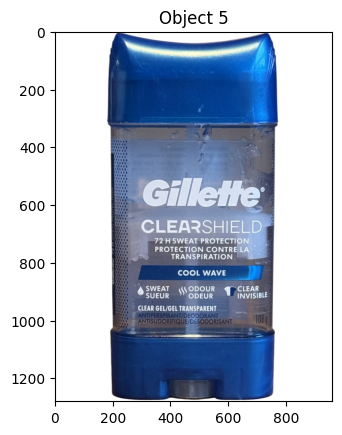

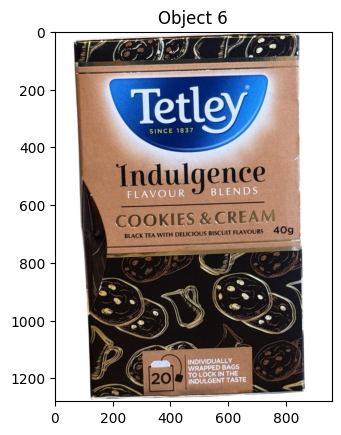

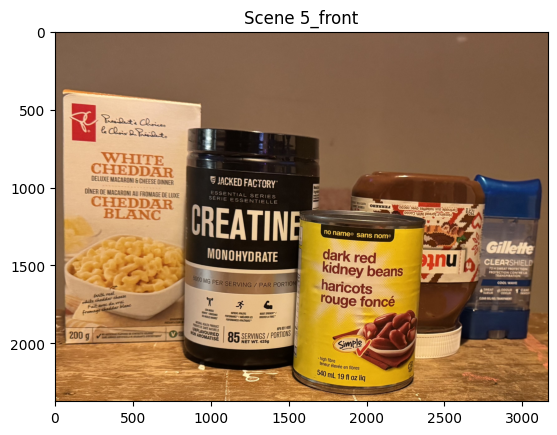

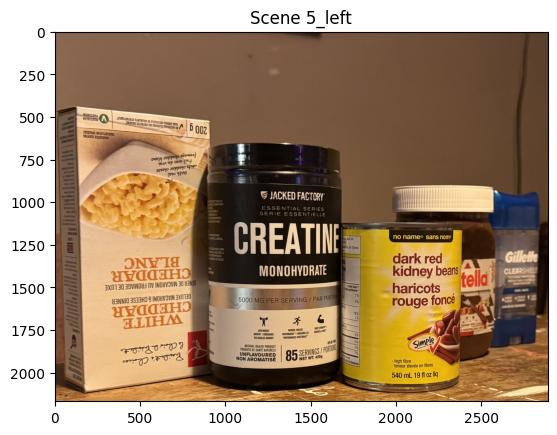

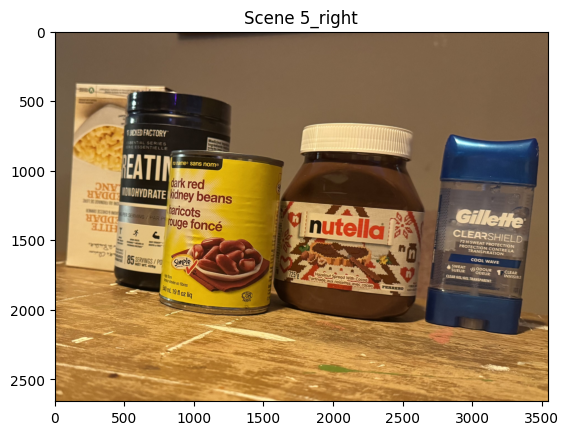

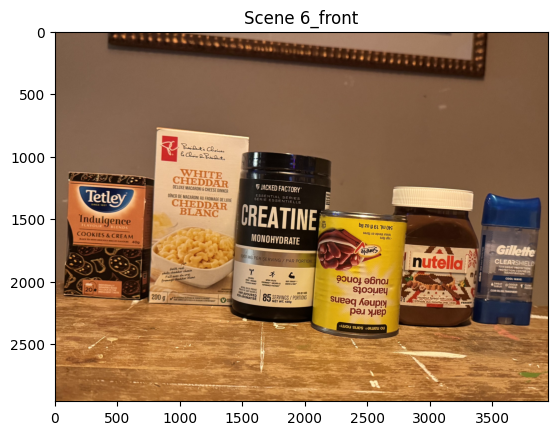

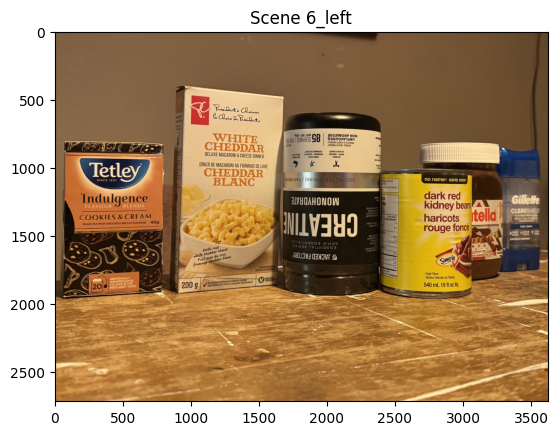

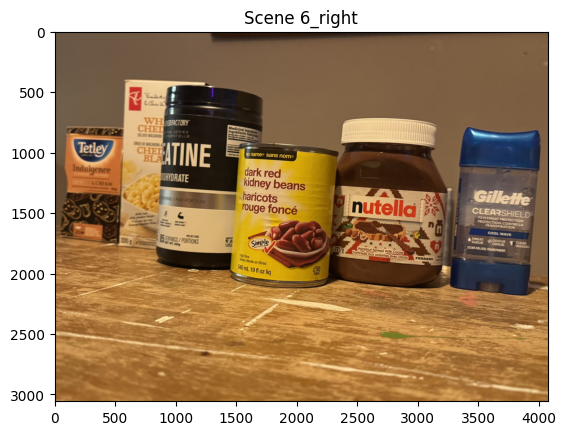

In [57]:
# Show a couple example object & scene images
for i in range(5,7):
    img = cv2.imread(f'../Objects_BG_Removed/O{i}.jpg')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f'Object {i}')
    plt.show()
for i in range(5,7):
    for j in ['front', 'left', 'right']:
        img = cv2.imread(f'../Scenes_Cropped/S{i}_{j}.jpg')
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f'Scene {i}_{j}')
        plt.show()


Running S1_front: Detected beans(O1)

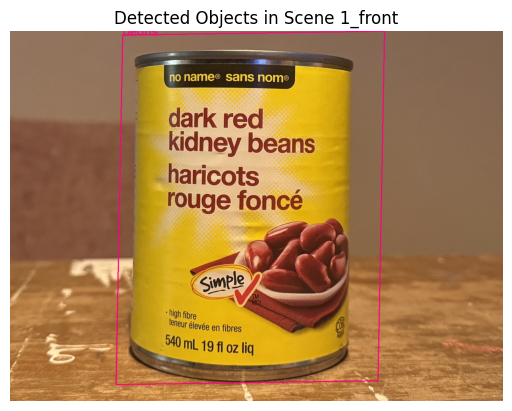


Running S1_left: Detected beans(O1)

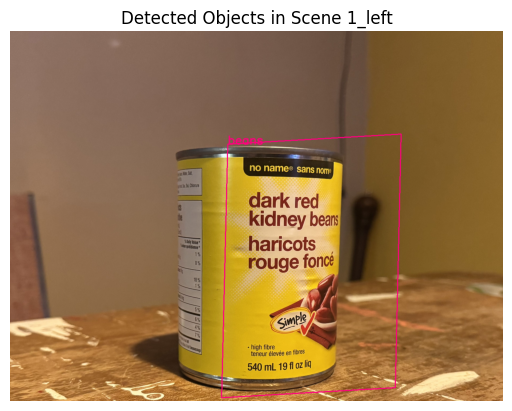


Running S1_right: Detected beans(O1), peanut_butter(O7)

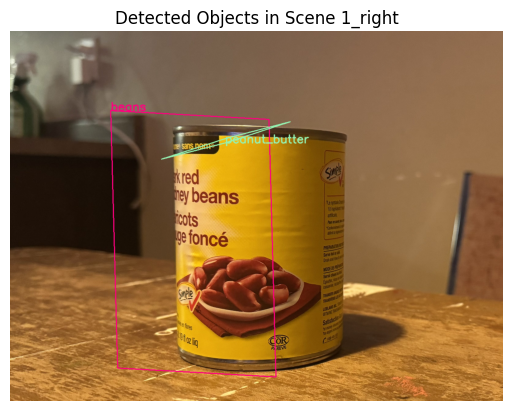


Running S2_front: Detected beans(O1), creatine(O2)

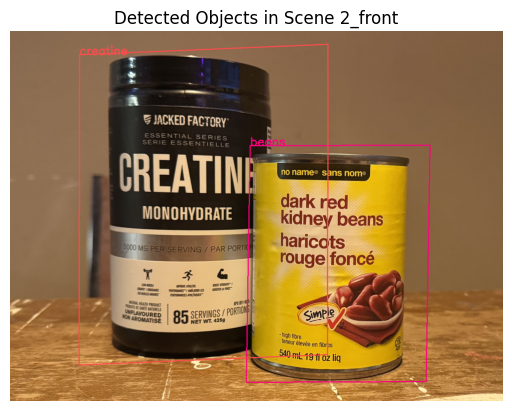


Running S2_left: Detected beans(O1), creatine(O2)

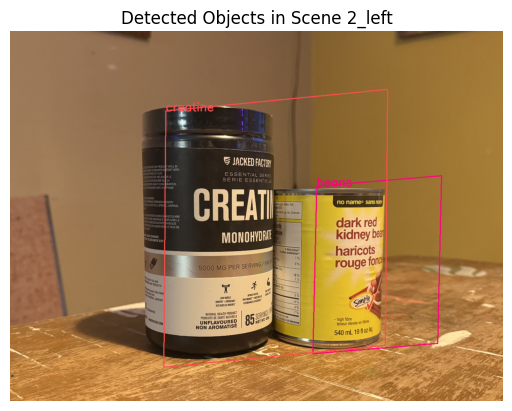


Running S2_right: Detected beans(O1), creatine(O2), peanut_butter(O7)

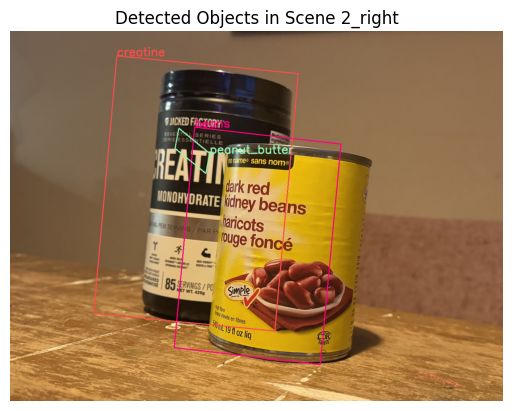


Running S3_front: Detected beans(O1), creatine(O2), nutella(O3), peanut_butter(O7)

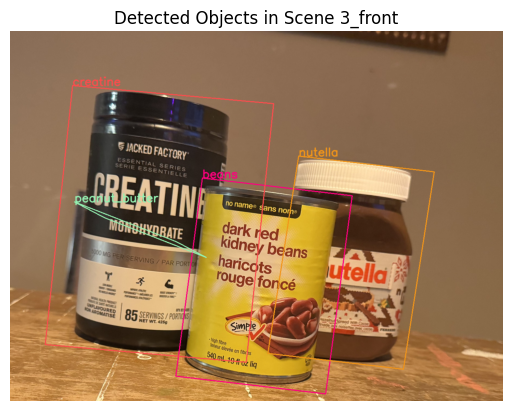


Running S3_left: Detected beans(O1), creatine(O2), nutella(O3)

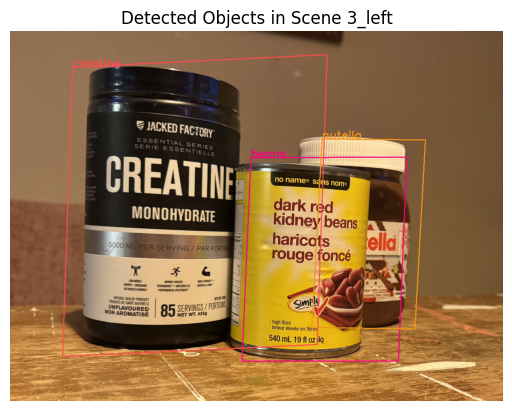


Running S3_right: Detected beans(O1), creatine(O2), nutella(O3)

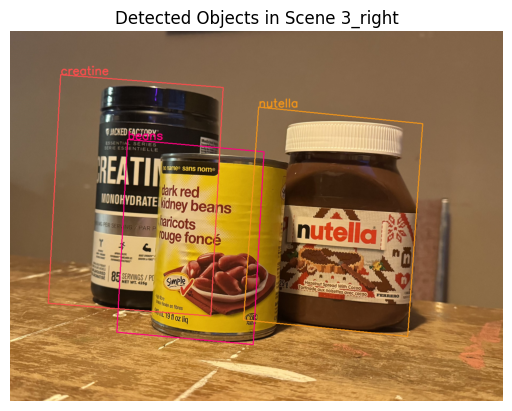


Running S4_front: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4)

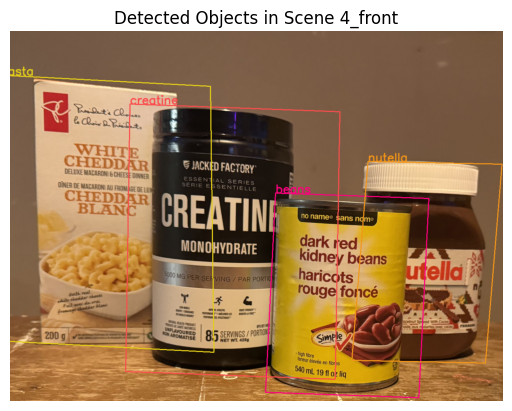


Running S4_left: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), peanut_butter(O7)

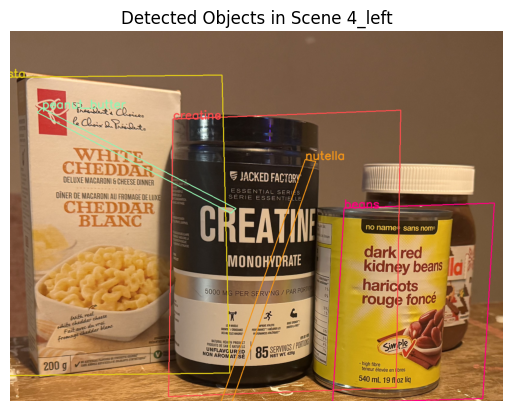


Running S4_right: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), peanut_butter(O7)

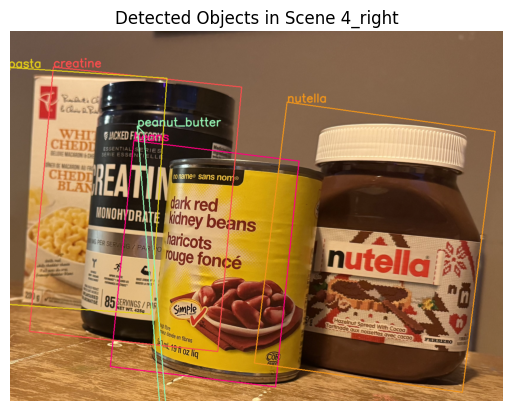


Running S5_front: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), deodorant(O5)

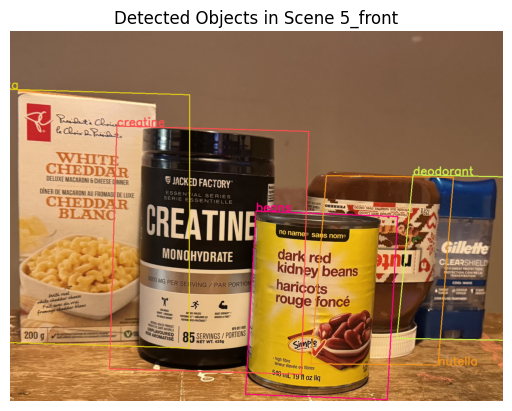


Running S5_left: Detected beans(O1), creatine(O2), pasta(O4)

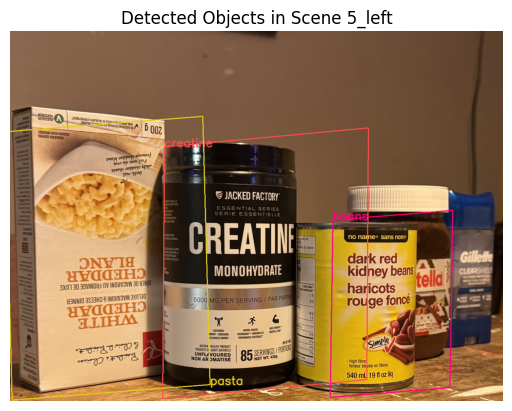


Running S5_right: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), deodorant(O5)

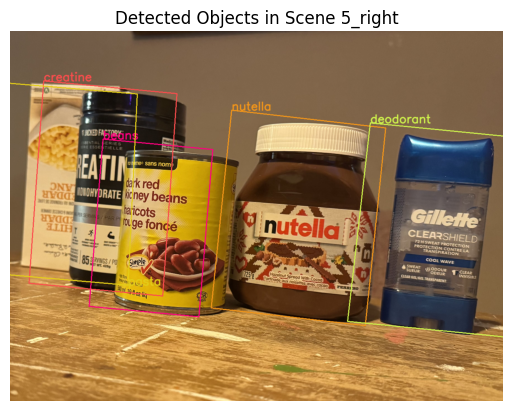


Running S6_front: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), deodorant(O5), tea(O6), peanut_butter(O7)

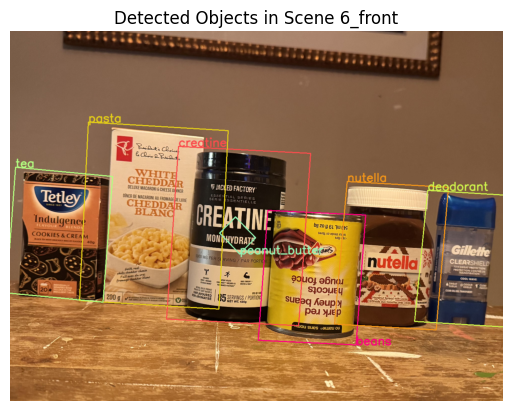


Running S6_left: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), tea(O6), peanut_butter(O7)

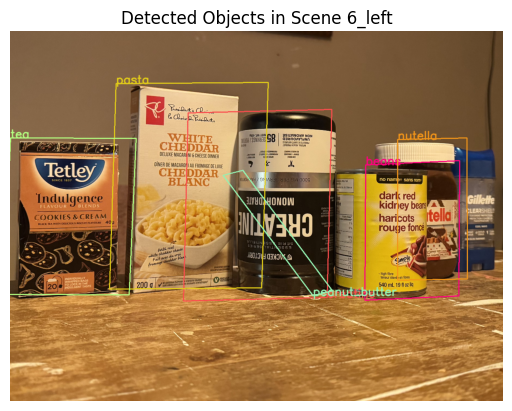


Running S6_right: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), deodorant(O5), tea(O6)

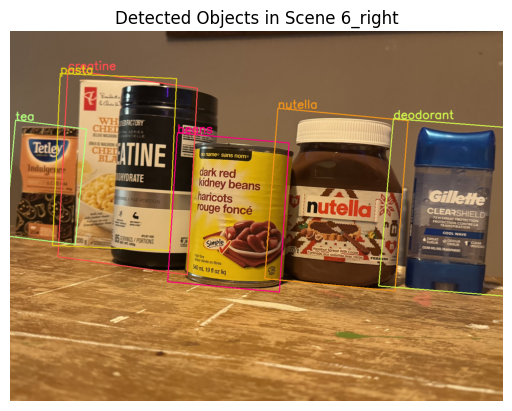


Running S7_front: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), tea(O6), peanut_butter(O7)

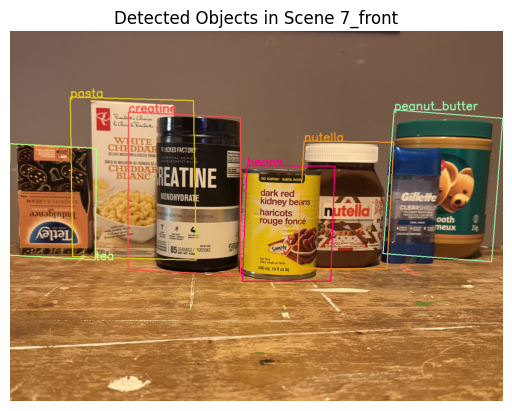


Running S7_left: Detected beans(O1), creatine(O2), pasta(O4), tea(O6)

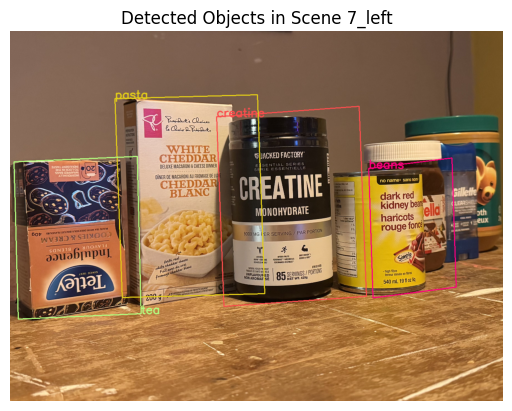


Running S7_right: Detected beans(O1), nutella(O3), deodorant(O5), peanut_butter(O7)

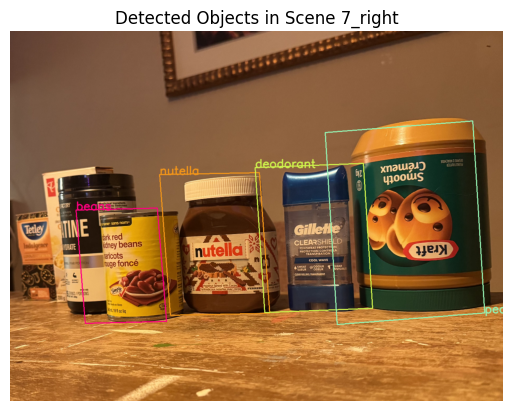


Running S8_front: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), deodorant(O5), tea(O6), peanut_butter(O7), reeses(O8)

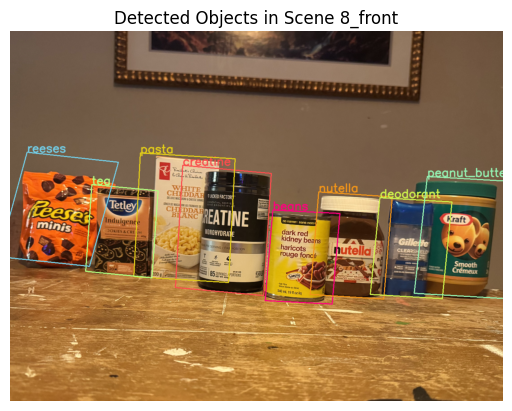


Running S8_left: Detected beans(O1), creatine(O2), pasta(O4), tea(O6), peanut_butter(O7), reeses(O8)

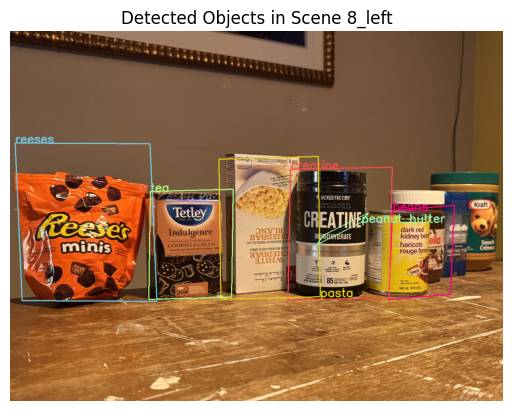


Running S8_right: Detected beans(O1), nutella(O3), deodorant(O5), peanut_butter(O7), book(O9)

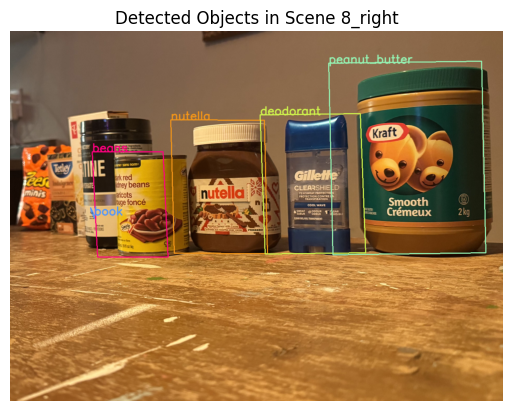


Running S9_front: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), tea(O6), peanut_butter(O7), reeses(O8), book(O9)

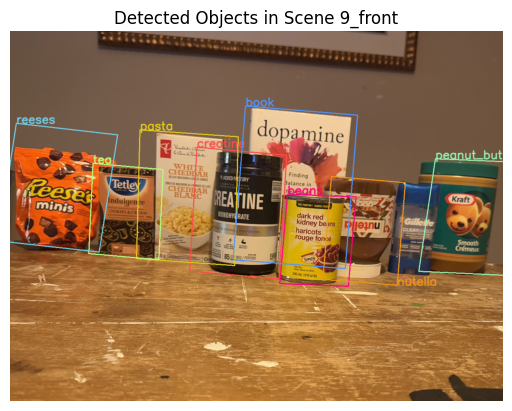


Running S9_left: Detected creatine(O2), pasta(O4), tea(O6), peanut_butter(O7), reeses(O8), book(O9)

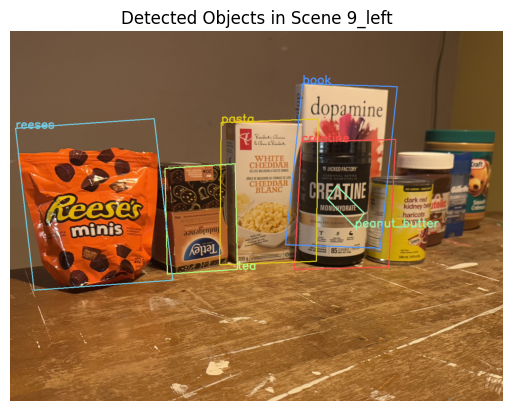


Running S9_right: Detected beans(O1), nutella(O3), deodorant(O5), tea(O6), peanut_butter(O7), book(O9)

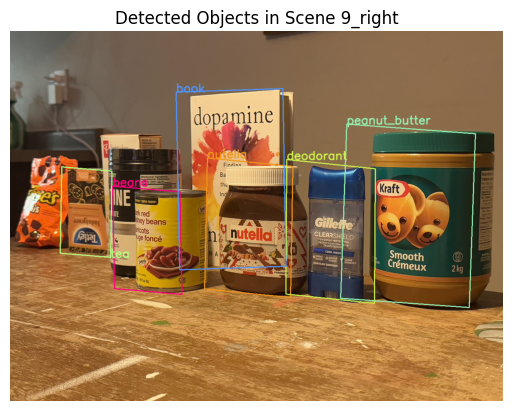


Running S10_front: Detected beans(O1), creatine(O2), nutella(O3), pasta(O4), tea(O6), peanut_butter(O7), reeses(O8), book(O9), lighter_fluid(O10)

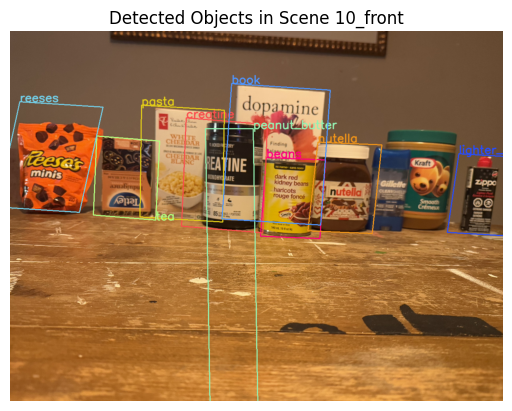


Running S10_left: Detected beans(O1), creatine(O2), pasta(O4), tea(O6), peanut_butter(O7), reeses(O8), book(O9)

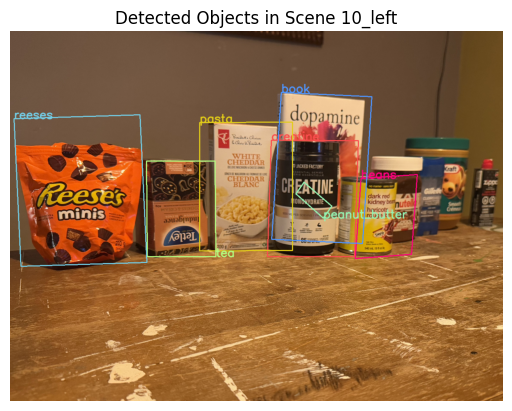


Running S10_right: Detected beans(O1), nutella(O3), deodorant(O5), tea(O6), peanut_butter(O7), reeses(O8), book(O9), lighter_fluid(O10)

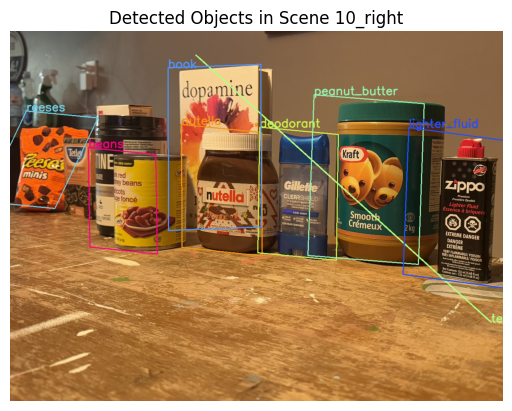

In [58]:
# detect objects in each scene image
'''
NOTES
In my initial attempt, I did the following:
- used SIFT to detect key points
- performed keypoint matching and filtered for good matches using a brute force matcher, KNN with K=2, and a threshold of 0.8
- computed homography matrix to detect inlier matches
This approach gave good results for scene images taken from straight on. However, it worked terribly for scene images shot from the left or right. 

Why? when the scene image is shot at an angle, the homography matrix fails to capture the transformation properly. Also, even though SIFT is invariant to scale, rotation, etc., it struggles when the camera viewpoint is changed
Solution: instead of homography matrix, fit affline transfomation model with RANSAC. This is more robust to transformations involving skewing due to a changed camera angle.

So, in the following code, I still used sift, KNN with K=2, and a threshold of 0.8 (same as my initial attempt). However, I computed the affline matrix instead of the homography matrix to detect inlier matches.
'''

def preprocess_image(img, type):
    """
    resize, remove noise, and improve contrast of an object image before detecting features

    Params
    - img: numpy array representing object image
    - type: "scene" or "object"

    Returns
    - img: preprocessed object image
    """
    if type == "scene":
        img = cv2.resize(img, (1280, 960)) # maintain 4:3
    else:
        img = cv2.resize(img, (960, 1280)) # maintain 3:4
    #img = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    #img = cv2.equalizeHist(img) # equalize image to improve contrast
    img = cv2.GaussianBlur(img, (3,3), 1) # blur to remove noise
    return img

def detect_object(O, S, threshold=0.8, ransac_threshold = 5.0, visualize=False):
    """
    Detects if object O is in scenery S

    Params
    O: numpy array representing object image
    S: numpy array representing scenery image
    threshold: max ratio value for a match to be labeled as a good match (the distance of the best match / distance of second best match should be lower than this value for the match to be labeled as good); defaults to 0.8 (i.e., 80%)
    ransac_theshold = max distance (in terms of pixels) a point can be to be an inlier; defaults to 5 pixels
    visualize = boolean option to see intermediate steps of algorithm; defaults to False

    Returns
    detected: True is object is detected, False otherwise
    corners: list of bounding box corners for object in scene image, None otherwise
    results: list of detection stats for the object, None otherwise
    """
    # extract features from each image using SIFT (SIFT is robust; it identifies key points and descriptors that are invariant to scale, rotation, etc.)
    sift = cv2.SIFT_create()
    key_pts_O, desc_O = sift.detectAndCompute(O, None) # key points = distinct regions in the image where repeatable and robust patterns exist, descriptors = vectors computed for each keypoint that describe the region around that keypoint 
    key_pts_S, desc_S = sift.detectAndCompute(S, None)

    # match descriptors using brute force matcher with default norm type for SIFT (NORM_L2 (i.e., euclidian distance))
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches = bf.knnMatch(desc_O, desc_S, k=2)  # for each descriptor in the object image, find the 2 closest neighbour descriptors in the scene image with the lowest euclidian distances (should we flip these?)

    # use ratio of distances to filter out ambiguous matches; if two descriptors are matched, their corresponding keypoints are considered 'matched keypoints'
    good_matches = []
    for m, n in matches:
        if m.distance < threshold * n.distance:  # 0.8 is the threshold mentioned in the slides; if distance of best match / distance of second best match is higher than 0.8, the match is ambiguous, so we disregard it
            good_matches.append(m) 

    # visualize key points corresponding to good matches; lines represent matches, dots represent key points (the flag ensures key points that haven't been matched don't show)
    if visualize:
        matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(matching_result, cmap='gray')
        plt.title(f'Good Matches (Considering Ratio)')
        plt.show()

    # instead of estimating a homography matrix, estimate affline transformation to better capture objects at left/right camera angles
    if len(good_matches) < 4:
        print("Less than 4 good matches")
        return False, None, None # if we currently have less than 4 good matches, skip object
    coord_O = np.float32([key_pts_O[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2) # this is an array where each element represents the coordinates (x,y) of a matched keypoint from the object image
    coord_S = np.float32([key_pts_S[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    aff_matrix, inliers = cv2.estimateAffine2D(coord_O, coord_S, method=cv2.RANSAC, ransacReprojThreshold=ransac_threshold) # compute affline matrix (using RANSAC) and inliers that indicate which matches fit within the specified threshold (threshold = max allowed error to classify point as inlier)
    if aff_matrix is None:
        print("No affline matrix")
        return False, None, None # if we fail to compute a valid affline transformation, skip object
    inliers = inliers.ravel().tolist() # flatten; each element is a 1 (indicating the match is an inlier) or a 0 (indicating the match is an outlier)
    num_inliers = sum(inliers)
    inlier_matches = [good_matches[i] for i in range(len(good_matches)) if inliers[i] == 1]

    # visualize key points corresponding to inlier matches from good_matches
    if visualize:
        matching_result = cv2.drawMatches(O, key_pts_O, S, key_pts_S, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        plt.imshow(matching_result, cmap='gray')
        plt.title(f'Inlier Matches (Considering Ratio & Affline)')
        plt.show()

    # calculate ratios
    inlier_match_ratio = num_inliers / len(good_matches)
    inlier_total_ratio = num_inliers / len(key_pts_O)
    match_ratio = len(good_matches) / len(key_pts_O)

    # Draw bounding box
    h, w = O.shape
    corners_O = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2) # identify corners in the object image
    corners_S = cv2.transform(corners_O, aff_matrix) # apply affline matrix to map corners of object image to corresponding spots in scene image
    if visualize:
        bounding_box = cv2.polylines(S.copy(), [np.int32(corners_S)], isClosed=True, color=(255, 255, 255), thickness=2) # draw box by connecting corners in scene image
        plt.imshow(bounding_box, cmap='gray')
        plt.title("Detected Object with Bounding Box")
        plt.show()
    detected = num_inliers >= 23 or inlier_match_ratio >= 0.16 # condition for determining if object is in scene image; this is the optimal condition calculated using auxiliary code in the final code chunk

    return detected, np.int32(corners_S), [len(key_pts_O), len(good_matches), num_inliers, inlier_match_ratio, inlier_total_ratio, match_ratio]

# dict mapping each object to a name
object_names = {
    'O1': 'beans',
    'O2': 'creatine',
    'O3': 'nutella',
    'O4': 'pasta',
    'O5': 'deodorant',
    'O6': 'tea',
    'O7': 'peanut_butter',
    'O8': 'reeses',
    'O9': 'book',
    'O10': 'lighter_fluid'
}

# Assign colour to each object for its bounding box
cmap = plt.get_cmap('rainbow')
colours = [cmap(i / len(object_names))[:3] for i in range(len(object_names))]
colours = [tuple(int(255 * c) for c in color) for color in colours]
object_colors = {name: color for name, color in zip(object_names.values(), colours)}

# df to store results
results_df = pd.DataFrame(columns=["Scene_ID", "Object_Name", "View", "Total_Keypoints", "Good_Matches", 
                                   "Num_Inliers", "Inlier_Match_Ratio", "Inlier_Total_Ratio", 
                                   "Match_Ratio", "Predicted_Detection", "Actual_Detection"])

# Detect objects in scenes
for j in range(0,10):
    for view in ['front', 'left', 'right']:
        # Open scene
        S = cv2.imread(f'../Scenes_Cropped/S{j+1}_{view}.jpg', cv2.IMREAD_GRAYSCALE)
        S = preprocess_image(S, "scene")
        boxes = []
        no_comma=True
        print(f"\nRunning S{j+1}_{view}:", end="")
        #print("*"*25)
        # Open object
        for i in range(0,10):
            O = cv2.imread(f'../Objects_BG_Removed/O{i+1}.jpg', cv2.IMREAD_GRAYSCALE)
            O = preprocess_image(O, "object")
            object_name = object_names[f'O{i+1}']
            #print(f"Object: {object_name}")
            predicted_detection, bounding_box, results = detect_object(O, S, 0.8, 5, False) #determine if object exists in the scene and get bounding box corners for it
            actual_detection = i<=j
            #print(f"Detection Prediction: {predicted_detection}\nActually in Scene? {actual_detection}")
            if results is not None:
                #print(f"Total Keypoints: {results[0]}, Good Matches: {results[1]}, Inliers: {results[2]}, Inlier-Matches Ratio: {results[3]:.2f}, Inlier-Total Ratio: {results[4]:.2f}, Match Ratio: {results[5]:.2f}\n")
                new_row = {
                    "Scene_ID": f"S{j+1}",
                    "Object_Name": object_name,
                    "View": view,
                    "Total_Keypoints": results[0],
                    "Good_Matches": results[1],
                    "Num_Inliers": results[2],
                    "Inlier_Match_Ratio": results[3],
                    "Inlier_Total_Ratio": results[4],
                    "Match_Ratio": results[5],
                    "Predicted_Detection": predicted_detection,
                    "Actual_Detection": actual_detection
                }
                results_df = pd.concat([results_df, pd.DataFrame([new_row])], ignore_index=True)
            if predicted_detection and bounding_box is not None:
                boxes.append((bounding_box, object_name))
                if no_comma:
                    print(f" Detected {object_name}(O{i+1})", end="")
                    no_comma=False
                else:
                    print(f", {object_name}(O{i+1})", end="")
        # Plot scene with boxes
        if boxes:
            original_scene = cv2.imread(f'../Scenes_Cropped/S{j+1}_{view}.jpg')
            scene_with_boxes = cv2.resize(original_scene, (1280, 960))
            #scene_with_boxes = cv2.cvtColor(S, cv2.COLOR_GRAY2BGR)  # convert to colour
            for box, name in boxes:
                color = object_colors[name]
                scene_with_boxes = cv2.polylines(scene_with_boxes, [box], isClosed=True, color=color, thickness=2)
                # add label to box
                top_left = tuple(box[0][0]) 
                cv2.putText(
                    scene_with_boxes,
                    name,
                    top_left,
                    cv2.FONT_HERSHEY_SIMPLEX, # font
                    1,  # font size
                    color,  # same color as bounding box
                    2,  # thickness
                    cv2.LINE_AA
                )
            plt.imshow(cv2.cvtColor(scene_with_boxes, cv2.COLOR_BGR2RGB))
            plt.title(f"Detected Objects in Scene {j+1}_{view}")
            plt.axis("off")
            plt.show()

In [59]:
# Results Analysis: using threshold=0.1 and ransac_threshold=5 as params, with optimal condition of Num_Inliers >= 23 or Inlier_Match_Ratio >= 0.16

# calculate TP, FN, TN, FP
TP = ((results_df["Predicted_Detection"] == True) & (results_df["Actual_Detection"] == True)).sum() # number of objects correctly detected to be in scenes
TN = ((results_df["Predicted_Detection"] == False) & (results_df["Actual_Detection"] == False)).sum() # number of objects correctly detected to not be in scenes
FP = ((results_df["Predicted_Detection"] == True) & (results_df["Actual_Detection"] == False)).sum() # number of objects detected to be in scenes they weren't actually in
FN = ((results_df["Predicted_Detection"] == False) & (results_df["Actual_Detection"] == True)).sum() # number of objects detected not to be in schemes they were actually in
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# calculate metrics
precision = TP / (TP + FP) if (TP + FP) > 0 else 0 # how many predicted positives are actually positive
recall = TP / (TP + FN) if (TP + FN) > 0 else 0 # how many actual positives are correctly identified
f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
accuracy = (TP + TN) / (TP + TN + FP + FN) if (TP + TN + FP + FN) > 0 else 0 # how many total predictions are correct (i.e., correctly identified positives or correctly identified negatives)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1_score:.2f}")
print(f"Accuracy: {accuracy:.2f}")

True Positives (TP): 136
True Negatives (TN): 127
False Positives (FP): 8
False Negatives (FN): 29
Precision: 0.94
Recall: 0.82
F1-Score: 0.88
Accuracy: 0.88


In [60]:
# Get data needed for Results.xlsx
scenes = sorted(results_df['Scene_ID'].unique())
views = ['front', 'left', 'right']
objects = sorted(results_df['Object_Name'].unique())
columns = objects + ['#TP', '#FP', '#TN', '#FN']
rows = [f"{scene}_{view}" for scene in scenes for view in views]
final_df = pd.DataFrame(index=rows, columns=columns).fillna(0)
for _, row in results_df.iterrows():
    index = f"{row['Scene_ID']}_{row['View']}"
    obj_col = row['Object_Name']
    if row['Num_Inliers'] >= 23 or row['Inlier_Match_Ratio'] >= 0.16:
        final_df.at[index, obj_col] = 1
    is_tp = row['Predicted_Detection'] and row['Actual_Detection']
    is_fp = row['Predicted_Detection'] and not row['Actual_Detection']
    is_fn = not row['Predicted_Detection'] and row['Actual_Detection']
    is_tn = not row['Predicted_Detection'] and not row['Actual_Detection']
    final_df.at[index, '#TP'] += int(is_tp)
    final_df.at[index, '#FP'] += int(is_fp)
    final_df.at[index, '#FN'] += int(is_fn)
    final_df.at[index, '#TN'] += int(is_tn)

# Display the resulting DataFrame
print(final_df)
final_df.to_csv("task12_results.csv")

           beans  book  creatine  deodorant  lighter_fluid  nutella  pasta  \
S1_front       1     0         0          0              0        0      0   
S1_left        1     0         0          0              0        0      0   
S1_right       1     0         0          0              0        0      0   
S10_front      1     1         1          0              1        1      1   
S10_left       1     1         1          0              0        0      1   
S10_right      1     1         0          1              1        1      0   
S2_front       1     0         1          0              0        0      0   
S2_left        1     0         1          0              0        0      0   
S2_right       1     0         1          0              0        0      0   
S3_front       1     0         1          0              0        1      0   
S3_left        1     0         1          0              0        1      0   
S3_right       1     0         1          0              0      

In [61]:
# Auxiliary code: experiment with different thresholds to see which give the best results

# Only use Num_Inliers and Inlier_Match_Ratio cols; from inspection, they tend to give best differentiation
col_vals = {
    "Num_Inliers": list(range(1, 31)),  # 1-30 incremented by 1
    "Inlier_Match_Ratio": np.round(np.arange(0.01, 0.30, 0.01), 3).tolist()  # 0.01-0.30 incremented by 0.001
}
column_combinations = [[col] for col in col_vals.keys()] + [list(col_vals.keys())]

# create all possible combinations
threshold_conditions = []
for combination in column_combinations:
    threshold_values = [
        [(col, threshold) for threshold in col_vals[col]]
        for col in combination
    ]
    threshold_conditions.extend(itertools.product(*threshold_values))

# Go through all combinations, create conditions using AND or OR, and evaluate
metrics = []
for condition in threshold_conditions:
    condition_and = " & ".join([f"(results_df['{col}'] >= {threshold})" for col, threshold in condition])
    condition_or = " | ".join([f"(results_df['{col}'] >= {threshold})" for col, threshold in condition])

    # evaluate AND condition
    results_df["Threshold_Detection"] = eval(condition_and)
    TP = ((results_df["Threshold_Detection"] == True) & (results_df["Actual_Detection"] == True)).sum()
    TN = ((results_df["Threshold_Detection"] == False) & (results_df["Actual_Detection"] == False)).sum()
    FP = ((results_df["Threshold_Detection"] == True) & (results_df["Actual_Detection"] == False)).sum()
    FN = ((results_df["Threshold_Detection"] == False) & (results_df["Actual_Detection"] == True)).sum()
    precision_and = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall_and = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1_and = (2 * precision_and * recall_and) / (precision_and + recall_and) if (precision_and + recall_and) > 0 else 0
    accuracy_and = (TP + TN) / (TP + TN + FP + FN) if (TP + TN + FP + FN) > 0 else 0
    metrics.append({
        "Condition": f"AND: {condition_and}",
        "Precision": precision_and,
        "Recall": recall_and,
        "F1-Score": f1_and,
        "Accuracy": accuracy_and
    })

    # evaluate OR condition
    results_df["Threshold_Detection"] = eval(condition_or)
    TP = ((results_df["Threshold_Detection"] == True) & (results_df["Actual_Detection"] == True)).sum()
    TN = ((results_df["Threshold_Detection"] == False) & (results_df["Actual_Detection"] == False)).sum()
    FP = ((results_df["Threshold_Detection"] == True) & (results_df["Actual_Detection"] == False)).sum()
    FN = ((results_df["Threshold_Detection"] == False) & (results_df["Actual_Detection"] == True)).sum()
    precision_or = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall_or = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1_or = (2 * precision_or * recall_or) / (precision_or + recall_or) if (precision_or + recall_or) > 0 else 0
    accuracy_or = (TP + TN) / (TP + TN + FP + FN) if (TP + TN + FP + FN) > 0 else 0
    metrics.append({
        "Condition": f"OR: {condition_or}",
        "Precision": precision_or,
        "Recall": recall_or,
        "F1-Score": f1_or,
        "Accuracy": accuracy_or
    })

# Show 5 best threshold combinations
metrics_df = pd.DataFrame(metrics)
pd.set_option('display.max_colwidth', None) # used to avoid Condition col being cut off
print(metrics_df.sort_values(by="F1-Score", ascending=False).head())

# Best condition based on results: Num_Inliers >= 23 or Inlier_Match_Ratio >= 0.16

                                                                               Condition  \
1433   OR: (results_df['Num_Inliers'] >= 23) | (results_df['Inlier_Match_Ratio'] >= 0.2)   
1491   OR: (results_df['Num_Inliers'] >= 24) | (results_df['Inlier_Match_Ratio'] >= 0.2)   
1549   OR: (results_df['Num_Inliers'] >= 25) | (results_df['Inlier_Match_Ratio'] >= 0.2)   
1427  OR: (results_df['Num_Inliers'] >= 23) | (results_df['Inlier_Match_Ratio'] >= 0.17)   
1665   OR: (results_df['Num_Inliers'] >= 27) | (results_df['Inlier_Match_Ratio'] >= 0.2)   

      Precision    Recall  F1-Score  Accuracy  
1433   0.985185  0.806061  0.886667  0.886667  
1491   0.985075  0.800000  0.882943  0.883333  
1549   0.985075  0.800000  0.882943  0.883333  
1427   0.957447  0.818182  0.882353  0.880000  
1665   0.992424  0.793939  0.882155  0.883333  


Image S1.jpg loaded successfully, shape: (4284, 5712, 3)
Image S2.jpg loaded successfully, shape: (4284, 5712, 3)
Image S3.jpg loaded successfully, shape: (4284, 5712, 3)
Image S4.jpg loaded successfully, shape: (4284, 5712, 3)
Image S5.jpg loaded successfully, shape: (3024, 4032, 3)
Image S6.jpg loaded successfully, shape: (3024, 4032, 3)
Image S7.jpg loaded successfully, shape: (3024, 4032, 3)
Image S8.jpg loaded successfully, shape: (3024, 4032, 3)
Image S9.jpg loaded successfully, shape: (4284, 5712, 3)
Image S10.jpg loaded successfully, shape: (3024, 4032, 3)
Panorama saved to ../Panorama/Panorama.jpg
Annotated panorama saved to ../Panorama/Panorama_bb.jpg


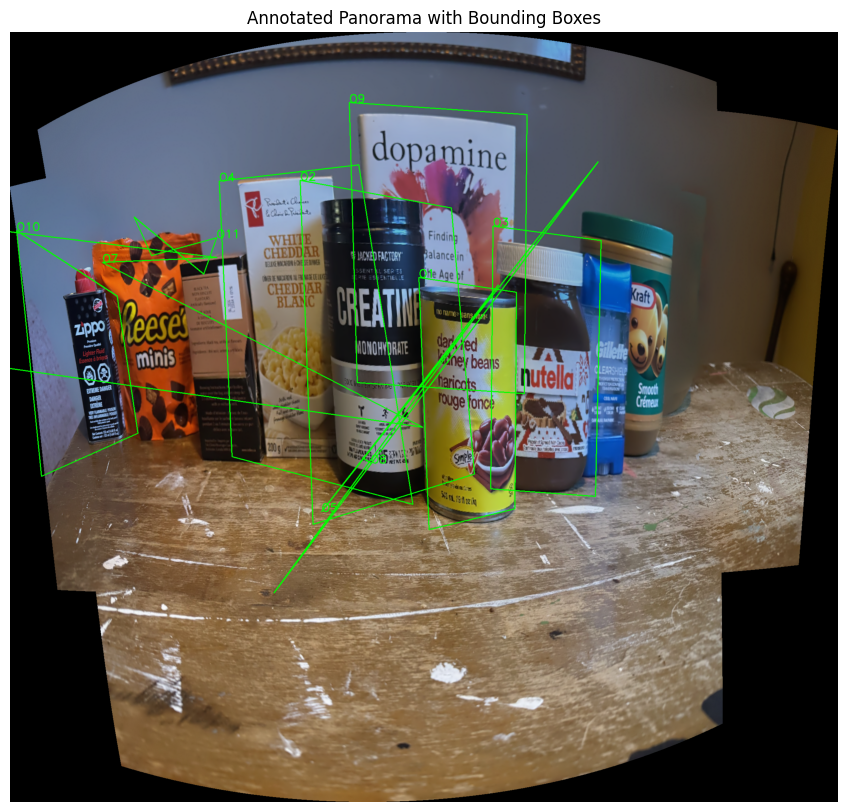

In [78]:
import os


def stitch_images(images):
    """
    Stitch a list of images into a panorama using feature matching and homography.
    
    Args:
    - images: List of images (numpy arrays) to stitch.

    Returns:
    - panorama: The stitched panorama image.
    """
    stitcher = cv2.Stitcher_create()
    status, panorama = stitcher.stitch(images)
    
    if status != cv2.Stitcher_OK:
        raise Exception(f"Stitching failed with status {status}")
    
    return panorama

def resize_images(images, target_resolution=(960, 1280)):
    """
    Resize all images to a consistent resolution.
    """
    return [cv2.resize(img, target_resolution) for img in images]

def crop_panorama(panorama):
    """
    Automatically crop a panorama to the smallest bounding rectangle 
    containing all non-black pixels.
    
    Args:
    - panorama: The stitched panorama image.
    
    Returns:
    - cropped_panorama: The cropped panorama image.
    """
    gray = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    x, y, w, h = cv2.boundingRect(thresh)
    cropped_panorama = panorama[y:y+h, x:x+w]
    return cropped_panorama


    
def detect_panoramic_object(panorama, object_image):
    

    """
    Detect an object in a panoramic image using SIFT, affine transformation, and RANSAC.

    Args:
    - O: Grayscale object image (template).
    - S: Grayscale scene image (panorama).
    - threshold: Lowe's ratio threshold for filtering good matches.
    - ransac_threshold: Maximum reprojection error threshold for RANSAC.
    - visualize: If True, visualizes matches and bounding box.

    Returns:
    - detected: Boolean, whether the object was detected.
    - bbox: The bounding box points of the detected object (or None if detection failed).
    - num_inliers: Number of inlier matches after RANSAC.
    """
    orb = cv2.ORB_create(nfeatures=12500)

    # Detect keypoints and compute descriptors
    kp_obj, des_obj = orb.detectAndCompute(object_image, None)
    kp_scene, des_scene = orb.detectAndCompute(panorama, None)

    # Match descriptors using BFMatcher with Lowe's ratio test
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des_obj, des_scene, k=2)

    # Filter matches using Lowe's ratio
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:  # Reduce threshold to improve quality
            good_matches.append(m)

    if len(good_matches) < 4:
        print("Not enough good matches.")
        return None

    # Extract matched keypoints
    src_pts = np.float32([kp_obj[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    # Find homography
    matrix, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 2.0)  # Reduce reprojection threshold
    if matrix is None:
        print("Homography could not be computed.")
        return None

    # Compute bounding box
    h, w = object_image.shape
    corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
    bbox = cv2.perspectiveTransform(corners, matrix)

    return np.int32(bbox)

def visualize_matches(panorama, object_image):
    orb = cv2.ORB_create()
    kp_obj, des_obj = orb.detectAndCompute(object_image, None)
    kp_scene, des_scene = orb.detectAndCompute(panorama, None)

    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    matches = flann.knnMatch(des_obj, des_scene, k=2)
    
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)
    
    result = cv2.drawMatches(object_image, kp_obj, 
                              panorama, kp_scene, 
                              good_matches, None, 
                              flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    plt.figure(figsize=(15, 10))
    plt.imshow(result)
    plt.title("Good Matches Visualization")
    plt.axis("off")
    plt.show()

def annotate_panorama(panorama, object_paths):
    """
    Detect objects in the panorama using ORB feature matching and annotate the panorama with bounding boxes.

    Args:
    - panorama: The stitched panorama image.
    - object_paths: List of file paths to the object images.

    Returns:
    - annotated_panorama: The panorama with bounding boxes and labels drawn.
    """
    annotated_panorama = panorama.copy()

    for obj_path in object_paths:
        obj_name = os.path.basename(obj_path).split('.')[0]

        obj_image = cv2.imread(obj_path, cv2.IMREAD_GRAYSCALE)
        if obj_image is None:
            print(f"Error: Object image {obj_path} could not be loaded.")
            continue

        bbox = detect_panoramic_object(cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY), obj_image)
        if bbox is not None:
            color = (0, 255, 0)  # Green for bounding boxes
            cv2.polylines(annotated_panorama, [bbox], isClosed=True, color=color, thickness=2)
            top_left = tuple(bbox[0][0])
            cv2.putText(annotated_panorama, obj_name, top_left, cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)

    return annotated_panorama

# Load images for stitching
input_folder = "../Panorama"
scene_images = [cv2.imread(f"{input_folder}/S{i+1}.jpg") for i in range(10)]

# Check if images were loaded successfully
loaded_images = []
for i, img in enumerate(scene_images):
    if img is None:
        print(f"Error: Image S{i+1}.jpg could not be loaded.")
    else:
        print(f"Image S{i+1}.jpg loaded successfully, shape: {img.shape}")
        loaded_images.append(img)

# Resize images to a consistent resolution
if len(loaded_images) > 0:
    resized_images = resize_images(loaded_images)
else:
    print("No images loaded successfully.")
    exit()

# Stitch the images into a panorama
try:
    panorama = stitch_images(resized_images)
    panorama = crop_panorama(panorama)
    panorama_path = f"{input_folder}/Panorama.jpg"
    cv2.imwrite(panorama_path, panorama)
    print(f"Panorama saved to {panorama_path}")

    # List of object images
    object_folder = "../Objects_BG_Removed"
    object_images = [f"{object_folder}/O{i+1}.jpg" for i in range(10)]
    object_images[5] = f"{object_folder}/O11.jpg"  # Use O11 instead of O6

    # Annotate the panorama
    annotated_panorama = annotate_panorama(panorama, object_images)
    annotated_path = f"{input_folder}/Panorama_bb.jpg"
    cv2.imwrite(annotated_path, annotated_panorama)
    print(f"Annotated panorama saved to {annotated_path}")

    # Display the annotated panorama
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(annotated_panorama, cv2.COLOR_BGR2RGB))
    plt.title("Annotated Panorama with Bounding Boxes")
    plt.axis("off")
    plt.show()
except Exception as e:
    print(f"Error during stitching or annotation: {e}")